In [1]:
using Random
using Dates
using Optimization
using Lux
using DiffEqFlux: NeuralODE, ADAMW, swish
using DifferentialEquations
using ComponentArrays
using BSON: @save, @load

In [56]:
using DataFrames, CSV, Dates, Statistics, Plots
path = "C:\\Users\\praty\\Downloads\\seoul_ex.csv"
df = CSV.read(path, DataFrame, types = Dict(:date => Date,
                                            :temp => Float64, 
                                            :humidity => Float64,
                                            :windspeed => Float64,
                                            :sealevelpressure => Float64,
                                            :moonphase => Float64))
#temp	humidity	windspeed	sealevelpressure	moonphase
features = [:temp	,:humidity,	:windspeed,	:sealevelpressure,	:moonphase]
units = ["°F"	,"humidity%",	"km/h",	"hPa"	,"moonphase"]
feature_names = ["temp",	"humidity",	"windspeed",	"sealevelpressure",	"moonphase"]
missing_per_column = map(col -> count(ismissing, col), eachcol(df))
println("Missing values per column: $missing_per_column")
dropmissing!(df) 
missing_per_column = map(col -> count(ismissing, col), eachcol(df))
println("Missing values per column: $missing_per_column")
function normalize(x)
    μ = mean(x; dims=2)
    σ = std(x; dims=2)
    z = (x .- μ) ./ σ
    return z, μ, σ
end
function plot_features(df)
    plots = map(enumerate(zip(features, feature_names, units))) do (i, (f, n, u))
        plot(df[:, :date], df[:, f],
             title=n, label=nothing,
             ylabel=u, size=(800, 600),
             color=i)
    end

    n = length(plots)
    plot(plots..., layout=(2,3))


end
function preprocess(raw_df, num_train=20)
    raw_df[:,:year] = Float64.(year.(raw_df[:,:date]))
    raw_df[:,:month] = Float64.(month.(raw_df[:,:date]))
    df = combine(
        groupby(raw_df, [:year, :month]),
        :date => (d -> mean(year.(d)) .+ mean(month.(d)) ./ 12 ),
        :temp => mean,
        :humidity => mean,
	    :windspeed => mean,
	    :sealevelpressure => mean,
	    :moonphase => mean,

        renamecols=false
    )

    t_and_y(df) = df[!, :date]', Matrix(df[!, features])'
    t_train, y_train = t_and_y(df[1:num_train,:])
    t_test, y_test = t_and_y(df[num_train+1:end,:])    
    t_train, t_mean, t_scale = normalize(t_train)
    y_train, y_mean, y_scale = normalize(y_train)
    t_test = (t_test .- t_mean) ./ t_scale
    y_test = (y_test .- y_mean) ./ y_scale

    return (
        vec(t_train), y_train,
        vec(t_test),  y_test,
        (t_mean, t_scale),
        (y_mean, y_scale)
    )
end

Missing values per column: [0, 0, 0, 0, 0, 0]
Missing values per column: [0, 0, 0, 0, 0, 0]


preprocess (generic function with 2 methods)

In [57]:
mutable struct ResidualBlock
    inner_layer::Chain
end

function ResidualBlock(input_dim, hidden_dim)
    return ResidualBlock(Chain(
        Dense(input_dim, hidden_dim, swish),
        Dense(hidden_dim, input_dim)
    ))
end

ResidualBlock

In [58]:
function neural_ode(t, data_dim)
    f = Lux.Chain(
            Lux.Dense(data_dim, 32, swish),
            Lux.Dense(32, 64, swish),
            Lux.Dense(64,64,swish),
            Lux.Dense(64, 32, swish),
            Lux.Dense(32, data_dim)
        )

    node = NeuralODE(
        f, extrema(t), Tsit5(),
        saveat=t,
        abstol=1e-9, reltol=1e-9
    )
    
    rng = Random.default_rng()
    p, state = Lux.setup(rng, f)

    return node, ComponentArray(p), state
end
     

neural_ode (generic function with 1 method)

In [59]:

function train_one_round(node, θ, state, y, opt, maxiters, rng, y0=y[:, 1]; kwargs...)
    predict(θ) = Array(node(y0, θ, state)[1])
    loss(θ) = sum(abs2, predict(θ) .- y)
    
    adtype = Optimization.AutoZygote()
    optf = OptimizationFunction((θ, p) -> loss(θ), adtype)
    optprob = OptimizationProblem(optf, θ)
    res = solve(optprob, Optimisers.AdamW(5e-3), maxiters=maxiters; kwargs...)
    res.minimizer, state
end


train_one_round (generic function with 2 methods)

In [60]:
function train(t, y, obs_grid, maxiters, lr, rng, θ=nothing, state=nothing; kwargs...)
    log_results(θs, losses) =
        (θ, loss) -> begin
        push!(θs, copy(θ))
        push!(losses, loss)
        false
    end

    θs, losses = ComponentArray[], Float32[]
    for k in obs_grid
        node, θ_new, state_new = neural_ode(t, size(y, 1))
        if θ === nothing θ = θ_new end
        if state === nothing state = state_new end

        θ, state = train_one_round(
            node, θ, state, y, AdamW(lr), maxiters, rng;
            callback=log_results(θs, losses),
            kwargs...
        )
    end
    final_loss=0
    θs, state, losses, final_loss
 
end


train (generic function with 3 methods)

[ Info: Fitting model...


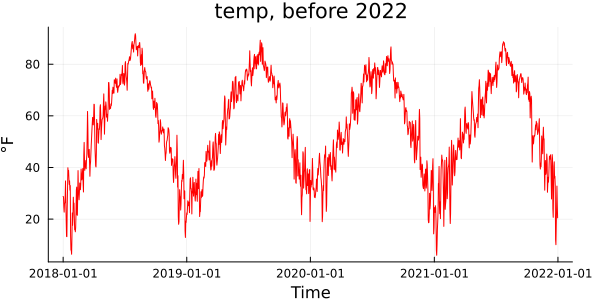

In [61]:
@info "Fitting model..."
colors = [:red, :blue, :green, :orange, :purple]
rng = MersenneTwister(123)

plt_features = plot_features(df)


df_2016 = filter(x -> x.date < Date(2022, 1, 1), df)
plt_2016 = plot(
    df_2016.date,
    df_2016.temp,
    title = "temp, before 2022",
    ylabel = units[1],
    xlabel = "Time",
    color = colors[1],
    size = (600, 300),
    label = nothing,
    right_margin=5Plots.mm
)

[ Info: Fitting model...


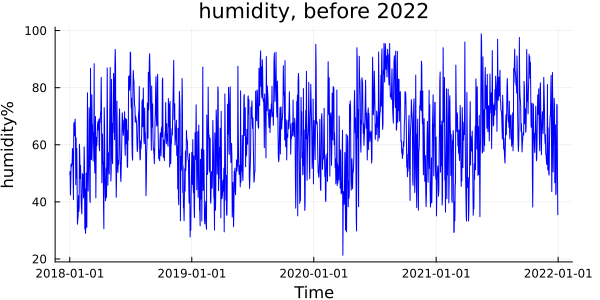

In [62]:
@info "Fitting model..."
colors = [:red, :blue, :green, :orange, :purple]
rng = MersenneTwister(123)

plt_features = plot_features(df)


df_2016 = filter(x -> x.date < Date(2022, 1, 1), df)
plt_2016 = plot(
    df_2016.date,
    df_2016.humidity,
    title = "humidity, before 2022",
    ylabel = units[2],
    xlabel = "Time",
    color = colors[2],
    size = (600, 300),
    label = nothing,
    right_margin=5Plots.mm
)

[ Info: Fitting model...


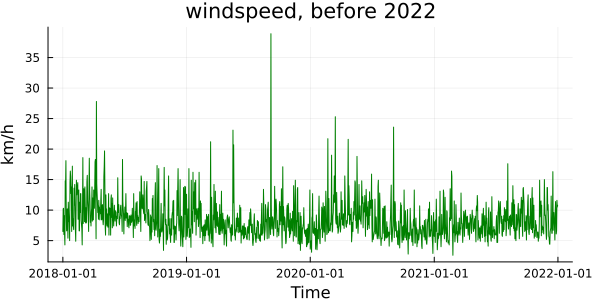

In [63]:
@info "Fitting model..."
rng = MersenneTwister(123)

plt_features = plot_features(df)


df_2016 = filter(x -> x.date < Date(2022, 1, 1), df)
plt_2016 = plot(
    df_2016.date,
    df_2016.windspeed,
    title = "windspeed, before 2022",
    ylabel = units[3],
    xlabel = "Time",
    color = colors[3],
    size = (600, 300),
    label = nothing,
    right_margin=5Plots.mm
)

[ Info: Fitting model...


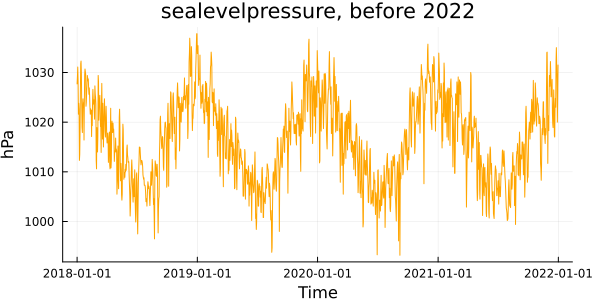

In [64]:
@info "Fitting model..."
rng = MersenneTwister(123)

plt_features = plot_features(df)


df_2016 = filter(x -> x.date < Date(2022, 1, 1), df)
plt_2016 = plot(
    df_2016.date,
    df_2016.sealevelpressure,
    title = "sealevelpressure, before 2022",
    ylabel = units[4],
    xlabel = "Time",
    color = colors[4],
    size = (600, 300),
    label = nothing,
    right_margin=5Plots.mm
)

[ Info: Fitting model...


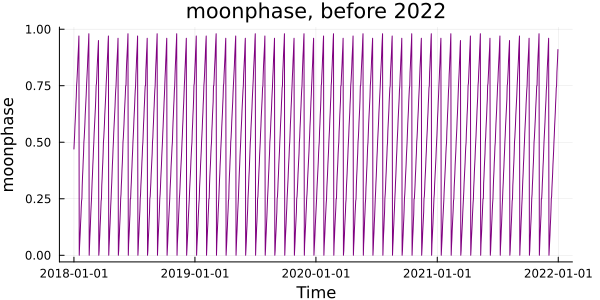

In [65]:
@info "Fitting model..."
rng = MersenneTwister(123)

plt_features = plot_features(df)


df_2016 = filter(x -> x.date < Date(2022, 1, 1), df)
plt_2016 = plot(
    df_2016.date,
    df_2016.moonphase,
    title = "moonphase, before 2022",
    ylabel = units[5],
    xlabel = "Time",
    color = colors[5],
    size = (600, 300),
    label = nothing,
    right_margin=5Plots.mm
)

In [66]:
t_train, y_train, t_test, y_test, (t_mean, t_scale), (y_mean, y_scale) = preprocess(df)

([-1.60579308398432, -1.4367622330383107, -1.267731382092763, -1.0987005311472149, -0.9296696802012057, -0.7606388292556577, -0.5916079783101097, -0.4225771273641006, -0.2535462764185526, -0.08451542547300459, 0.08451542547300459, 0.2535462764185526, 0.4225771273641006, 0.5916079783101097, 0.7606388292556577, 0.9296696802012057, 1.0987005311472149, 1.267731382092763, 1.4367622330383107, 1.60579308398432], [-1.5703763275738059 -1.369889457963662 … 1.1671739734238844 1.261701518496139; -1.0477421682707784 -1.5653056498412024 … 1.392085681481605 1.5660734051934555; … ; 1.169563579803565 1.0761049280717487 … -1.3549144527558288 -1.2405382040589765; -0.23021649308404527 0.5809266732566836 … 2.098742557114937 -2.298332129660751], [1.774823934929868, 1.943854785875416, 2.1128856368214253, 2.2819164877669733, 2.450947338712521, 2.6199781896585304, 2.7890090406040784, 2.9580398915496264, 3.1270707424956354, 3.2961015934411835  …  4.986410102898047, 5.155440953844056, 5.324471804789604, 5.493502

In [67]:
t_train

20-element Vector{Float64}:
 -1.60579308398432
 -1.4367622330383107
 -1.267731382092763
 -1.0987005311472149
 -0.9296696802012057
 -0.7606388292556577
 -0.5916079783101097
 -0.4225771273641006
 -0.2535462764185526
 -0.08451542547300459
  0.08451542547300459
  0.2535462764185526
  0.4225771273641006
  0.5916079783101097
  0.7606388292556577
  0.9296696802012057
  1.0987005311472149
  1.267731382092763
  1.4367622330383107
  1.60579308398432

In [68]:
using Optimisers
using OptimizationOptimisers

In [69]:
using Optimisers: AdamW

In [70]:
rng = MersenneTwister(123)

MersenneTwister(123)

In [87]:

obs_grid = 4:4:length(t_train) # we train on an increasing amount of the first k obs
maxiters = 400
lr = 5e-3
θs, state, losses, final_loss = train(t_train, y_train, obs_grid, maxiters, lr, rng, progress=true);


predict(y0, t, θ, state) = begin
    node, _, _ = neural_ode(t, length(y0))
    ŷ = Array(node(y0, θ, state)[1])
end

loss: 15.9: 100%|███████████████████████████████████████| Time: 0:06:199mm
loss: 17.5: 100%|███████████████████████████████████████| Time: 0:09:21
loss: 11.6: 100%|███████████████████████████████████████| Time: 0:09:46
loss: 10.8: 100%|███████████████████████████████████████| Time: 0:10:54
loss: 9.61: 100%|███████████████████████████████████████| Time: 0:13:54


predict (generic function with 1 method)

In [89]:
colors = [:red, :blue, :green, :orange, :purple]
function plot_pred(t, y, ŷ)
    plt = Plots.scatter(t, y, label="Observation")
    Plots.plot!(plt, t, ŷ, label="Prediction")
end

function plot_pred(t, y, t̂, ŷ; kwargs...)
    plot_params = zip(eachrow(y), eachrow(ŷ), feature_names, units)
    plts_preds = map(enumerate(plot_params)) do (i, (yᵢ, ŷᵢ, name, unit))
        plt = Plots.plot(
            t̂, ŷᵢ, label="Prediction", color=colors[i], linewidth=3,
            legend=nothing, title=name; kwargs...
        )
        Plots.scatter!(
            plt, t, yᵢ, label="Observation",
            xlabel="Time", ylabel=unit,
            markersize=5, color=i
        )
    end
end

function plot_result(t, y, t̂, ŷ, loss, num_iters; kwargs...)
    plot_params = zip(eachrow(y), eachrow(ŷ), feature_names, units)
    plts_preds = plot_pred(t, y, t̂, ŷ; kwargs...)
    plot!(plts_preds[1], ylim=(0, 100), legend=(0.65, 1.0))
    plot!(plts_preds[2], ylim=(30, 100))
    plot!(plts_preds[3], ylim=(5, 20))
    plot!(plts_preds[4], ylim=(990, 1050))
    plot!(plts_preds[5], ylim=(0.4, 0.6))


    p_loss = Plots.plot(
        loss, label=nothing, linewidth=3,
        title="Loss", xlabel="Iterations",
        xlim=(0, num_iters)
    )
    plots = [plts_preds..., p_loss]
    plt = Plots.plot(plots..., layout=grid(length(plots), 1), size=(900, 900))
end

function animate_training(plot_frame, t_train, y_train, θs, losses, obs_grid; pause_for=300)
    obs_count = Dict(i - 1 => n for (i, n) in enumerate(obs_grid))
    is = [min(i, length(losses)) for i in 2:(length(losses) + pause_for)]
    @animate for i in is
        stage = Int(floor((i - 1) / length(losses) * length(obs_grid)))
        k = obs_count[stage]
        plt = plot_frame(t_train[1:k], y_train[:,1:k], θs[i], losses[1:i])
    end every 2
end

function plot_extrapolation(t_train, y_train, t_test, y_test, t̂, ŷ)
    plts = plot_pred(t_train, y_train, t̂, ŷ)
    for (i, (plt, y)) in enumerate(zip(plts, eachrow(y_test)))
        Plots.scatter!(plt, t_test, y, color=colors[i], markerstrokecolor=:white, label="Test observation")
    end

    plot!(plts[1], ylim=(0, 100), legend=:topleft)
    plot!(plts[2], ylim=(30,100))
    plot!(plts[3], ylim=(5, 20))
    plot!(plts[4], ylim=(990, 1060))
    plot!(plts[5], ylim=(0.4, 0.6))
    Plots.plot(plts..., layout=grid(length(plts), 1), size=(900, 900))
end

plot_extrapolation (generic function with 1 method)

In [91]:
function plot_pred(
    t_train, y_train, t_grid,
    rescale_t, rescale_y, num_iters, θ, state, loss, y0=y_train[:, 1]
)
    ŷ = predict(y0, t_grid, θ, state)
    plt = plot_result(
        rescale_t(t_train),
        rescale_y(y_train),
        rescale_t(t_grid),
        rescale_y(ŷ),
        loss,
        num_iters
    )
    display(plt)  # This will show the plot
    return ŷ, plt
end


plot_pred (generic function with 4 methods)

In [93]:

function plot_pred(
    t_train, y_train, t_grid,
    rescale_t, rescale_y, num_iters, θ, state, loss, y0=y_train[:, 1]
)
    ŷ = predict(y0, t_grid, θ, state)
    plt = plot_result(
        rescale_t(t_train),
        rescale_y(y_train),
        rescale_t(t_grid),
        rescale_y(ŷ),
        loss,
        num_iters
    )
    
end

@info "Generating training animation..."
num_iters = length(losses)
t_train_grid = collect(range(extrema(t_train)..., length=500))
rescale_t(x) = t_scale .* x .+ t_mean
rescale_y(x) = y_scale .* x .+ y_mean
plot_frame(t, y, θ, loss) = plot_pred(
    t, y, t_train_grid, rescale_t, rescale_y, num_iters, θ, state, loss
)
anim = animate_training(plot_frame, t_train, y_train, θs, losses, obs_grid);


@info "Generating extrapolation plot..."
t_grid = collect(range(minimum(t_train), maximum(t_test), length=500))
ŷ = predict(y_train[:,1], t_grid, θs[end], state)
plt_ext = plot_extrapolation(
    rescale_t(t_train),
    rescale_y(y_train),
    rescale_t(t_test),
    rescale_y(y_test),
    rescale_t(t_grid),
    rescale_y(ŷ)
);


@info "Done!"

[ Info: Generating training animation...
[ Info: Generating extrapolation plot...
[ Info: Done!


In [94]:
using Statistics

# Sample input matrix of size 5x500
matrix = ŷ  # Replace this with your actual data

# Target dimensions
target_cols = 29

# Step size to group columns (approximate size of each group)
step_size = div(size(matrix, 2), target_cols)

# Initialize the resulting matrix
averaged_matrix = zeros(size(matrix, 1), target_cols)

# Loop over each row and compute averages
for i in 1:size(matrix, 1)
    for j in 1:target_cols
        # Determine start and end indices for this group of columns
        start_idx = (j - 1) * step_size + 1
        end_idx = min(j * step_size, size(matrix, 2))
        
        # Compute the mean for this segment and store it
        averaged_matrix[i, j] = mean(matrix[i, start_idx:end_idx])
    end
end

@show averaged_matrix


averaged_matrix = [-1.3157754318519388 -0.37329641153967164 0.49531748526425734 1.1319932148133776 1.1111426926963883 0.14144675596596343 -0.9784655056086744 -1.3116179994441037 -0.7790946884940625 0.23625126412233807 0.8894104528080472 1.3209867172999163 0.3702658437644003 -0.608340379579389 -1.387054772399249 -1.3975455256952423 -0.765008615214384 0.16087634933913908 0.8400040194851892 0.5093685415547796 -0.6038784827683519 -1.5115348840687028 -1.6320362551760201 -1.1150048525593894 -0.26165410451600846 0.4587336903901167 0.38554289868445385 -0.8158614960038891 -1.7802297861183267; -0.8567331999773935 -0.18585551989919247 0.44388633122815474 1.0265572505279426 0.9131927454021619 0.6624715513591782 -0.47789910545877917 -1.1966659317925044 -0.8591846153283776 -0.7757998404414529 0.18623413355600432 1.77794216277245 0.8175075494539452 0.5786286149077142 -0.3184397339651962 -0.5903598173954382 -0.334749684580383 0.008714304802649887 1.7255463968448534 1.3699094885855403 0.841340186538374

5×29 Matrix{Float64}:
 -1.31578   -0.373296    0.495317   …   0.385543  -0.815861  -1.78023
 -0.856733  -0.185856    0.443886       1.79225    1.05191   -0.0525583
  1.11568    1.76134     1.00982       -1.39395   -1.50198   -1.29664
  0.974565   0.372629   -0.575348      -0.561879   0.569078   1.40653
 -0.01787   -0.0236857   0.0646471     -1.99109   -1.93696   -1.63329

In [95]:
using Interpolations

# Original 5x29 matrix
original_matrix = y_test  # Replace this with your actual matrix

# Function to extrapolate and expand the matrix
function extrapolate_matrix(original_matrix, new_size=500)
    rows, cols = size(original_matrix)
    new_cols = new_size
    
    # Create an interpolating function for each row
    interpolated_matrix = zeros(rows, new_cols)
    
    for i in 1:rows
        # Interpolate linearly for each row
        itp = interpolate(original_matrix[i, :], BSpline(Linear()))
        interpolated_matrix[i, :] = [itp(j) for j in LinRange(1, cols, new_cols)]
    end
    
    return interpolated_matrix
end

# Extrapolate to 5x500 matrix
expanded_matrix = extrapolate_matrix(original_matrix, 500)

# Print or use the result
println(size(expanded_matrix))  # It should print (5, 500)


(5, 500)


In [96]:
rescale_y(expanded_matrix)

5×500 Matrix{Float64}:
   72.3        71.6672      71.0344    …    24.5842      24.0421      23.5
   72.1433     71.9474      71.7515         46.2071      45.2535      44.3
    9.16667     9.14356      9.12045         5.8421       5.67105      5.5
 1014.83     1015.07      1015.31         1030.79      1031.15      1031.5
    0.483       0.481384     0.479767        0.890114     0.915057     0.94

In [97]:
rescale_y(ŷ)

5×500 Matrix{Float64}:
   24.9032      25.3813      25.8784    …    17.9125      18.2192
   51.6742      51.8445      52.0148         56.7862      56.9231
   10.0742      10.095       10.119           7.53119      7.5058
 1024.68      1024.49      1024.3          1024.41      1024.1
    0.487742     0.488369     0.488979        0.465626     0.466167

In [98]:
using Statistics

# Assuming `predictions` and `test` are your 5x29 matrices
predictions = rescale_y(ŷ)  # Replace with your prediction matrix
test = rescale_y(expanded_matrix)                  # Replace with your test matrix

# Calculate RMSE for each row (sample)
rmse_per_row = sqrt.(mean((predictions .- test) .^ 2, dims=2))

# Print RMSE for each row
for i in 1:size(rmse_per_row, 1)
    println("RMSE for row $i: ", rmse_per_row[i])
end



RMSE for row 1: 25.315116277672114
RMSE for row 2: 9.500107976837887
RMSE for row 3: 1.5025248027665377
RMSE for row 4: 8.969798170952341
RMSE for row 5: 0.061255398935795


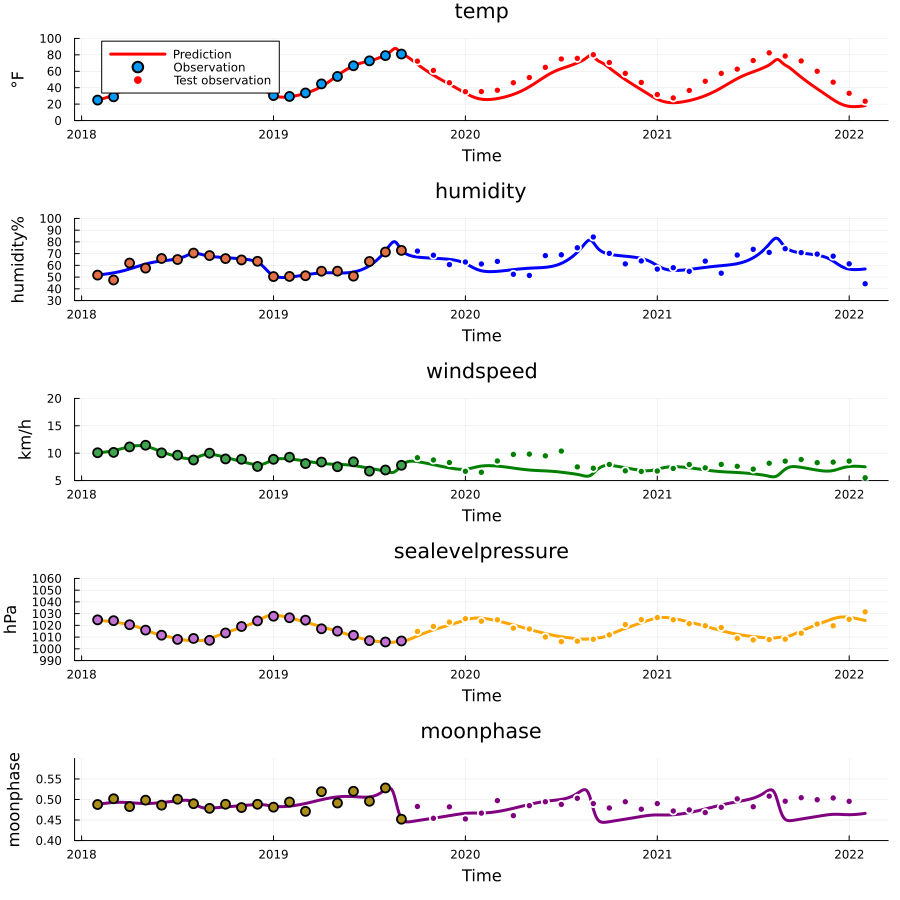

In [99]:
display(plt_ext)

[ Info: Saved animation to C:\Users\praty\Downloads\tmp.gif


Plots.AnimatedGif("C:\\Users\\praty\\Downloads\\tmp.gif")
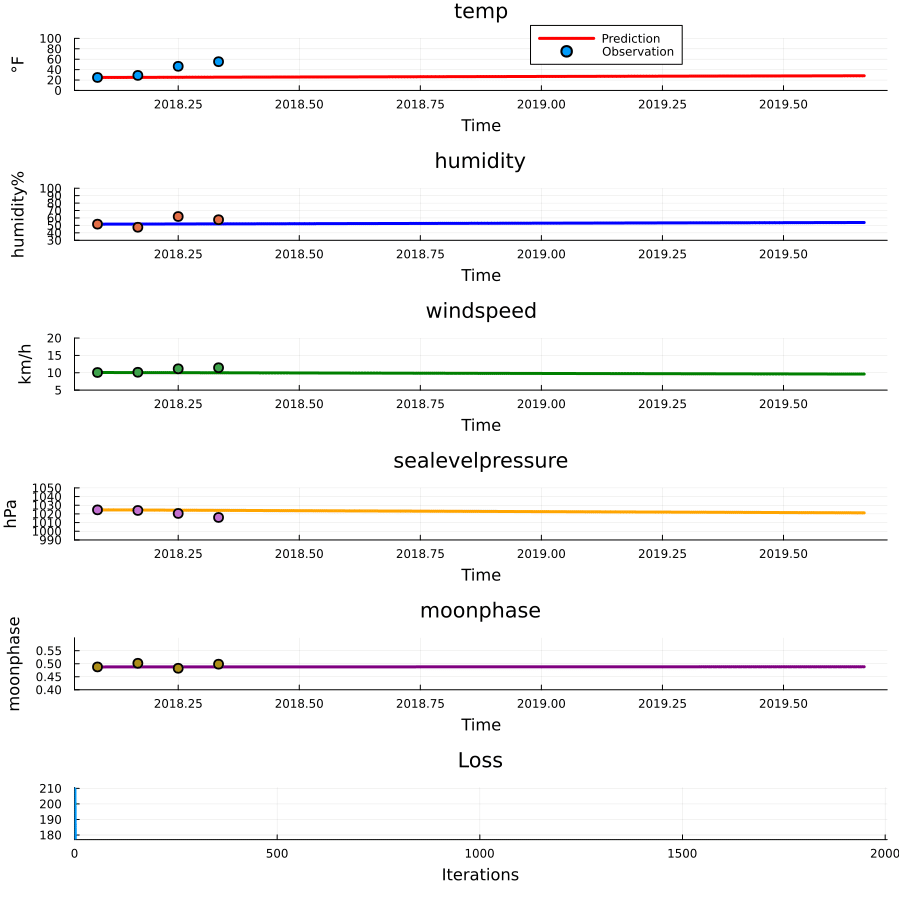

In [100]:
gif(anim, fps=10)